# Lab №2

## Execution

### 0. Importing the necessary libraries

In [1]:
from math import pi
import numpy as np
import roboticstoolbox as rtb
import matplotlib.pyplot as plt
import spatialmath.base as sb

### 1. Importing the UR5 model -  Импортируем модель UR5

In [2]:
robot = rtb.models.DH.UR5() # REMOVE THE .DH TO DISPLAY THE ROBOT LINKS AND JOINTS PARAMETERS. BUT PUT IT BACK TO RUN THE PROGRAM WITHOUT ERROR MSGS POPPING UP
print(robot)

DHRobot: UR5 (by Universal Robotics), 6 joints (RRRRRR), dynamics, standard DH parameters
┌─────┬─────────┬─────────┬────────┐
│ θⱼ  │   dⱼ    │   aⱼ    │   ⍺ⱼ   │
├─────┼─────────┼─────────┼────────┤
│  q1 │ 0.08946 │       0 │  90.0° │
│  q2 │       0 │  -0.425 │   0.0° │
│  q3 │       0 │ -0.3922 │   0.0° │
│  q4 │  0.1091 │       0 │  90.0° │
│  q5 │ 0.09465 │       0 │ -90.0° │
│  q6 │  0.0823 │       0 │   0.0° │
└─────┴─────────┴─────────┴────────┘

┌──┬──┐
└──┴──┘

┌──────┬───────┬─────┬─────┬─────┬──────┬─────┐
│ name │ q0    │ q1  │ q2  │ q3  │ q4   │ q5  │
├──────┼───────┼─────┼─────┼─────┼──────┼─────┤
│   qr │  180° │  0° │  0° │  0° │  90° │  0° │
│   qz │  0°   │  0° │  0° │  0° │  0°  │  0° │
└──────┴───────┴─────┴─────┴─────┴──────┴─────┘



In [3]:
print(robot.links[0].dyn())  # initial dynamic parameters of the first link

m     =       3.7 
r     =         0   -0.026   0.0019 
        |        0        0        0 | 
I     = |        0        0        0 | 
        |        0        0        0 | 
Jm    =         0 
B     =         0 
Tc    =         0(+)        0(-) 
G     =         1 
qlim  =         0 to        0


LINKS JACOBIAN DISPLAY

In [4]:
for i,link in enumerate(robot.links): # DISPLAYS THE LINKS JACOBIAN
    print(f"Link {i}: {link}")

Link 0: RevoluteDH:   θ=q,  d=0.089459,  a=0,  ⍺=1.5707963267948966
Link 1: RevoluteDH:   θ=q,  d=0,  a=-0.425,  ⍺=0.0
Link 2: RevoluteDH:   θ=q,  d=0,  a=-0.39225,  ⍺=0.0
Link 3: RevoluteDH:   θ=q,  d=0.10915,  a=0,  ⍺=1.5707963267948966
Link 4: RevoluteDH:   θ=q,  d=0.09465,  a=0,  ⍺=-1.5707963267948966
Link 5: RevoluteDH:   θ=q,  d=0.0823,  a=0,  ⍺=0.0


ENTERING THE ROBOT PARAMETERS - DATASHEET

In [5]:
# DEFINE THE MASS FOR EACH LINK (AS PER MODEL DATASHEET)
robot.links[0].m=3.7
robot.links[1].m = 8.39
robot.links[2].m = 2.27
robot.links[3].m = 1.22
robot.links[4].m = 1.22
robot.links[5].m = 0.188


In [6]:
# DEFINE THE CENTER OF MASS FOR EACH LINK
robot.links[0].r = [0, 0, 0]
robot.links[1].r = [0, 0, 0.28]
robot.links[2].r = [0, 0, 0.196]
robot.links[3].r = [0, 0.093, 0]
robot.links[4].r = [0, 0, 0.0946]
robot.links[5].r = [0, 0.065, 0]

In [7]:
# DEFINE THE INERTIA TENSOR OF EACH LINK I.E [Lxx, Lyy, Lzz, Lxy, Lyz, Lxz]
robot.links[0].I = [0.0103, 0.0103, 0.00666, 0, 0, 0]
robot.links[1].I = [0.227, 0.227, 0.0151, 0, 0, 0]
robot.links[2].I = [0.0312, 0.0312, 0.00409, 0, 0, 0]
robot.links[3].I = [0.00256, 0.00256, 0.00219, 0, 0, 0]
robot.links[4].I = [0.00256, 0.00256, 0.00219, 0, 0, 0]
robot.links[5].I = [8.47e-05, 8.47e-05, 0.000132, 0, 0, 0]

In [8]:
# DEFINE THE MOMENTS OF INERTIA OF THE DRIVES
robot.links[0].Jm = 0
robot.links[1].Jm = 0
robot.links[2].Jm = 0
robot.links[3].Jm = 0
robot.links[4].Jm = 0
robot.links[5].Jm = 0

In [9]:
# DEFINE THE COEFFICIENTS OF VISCOUS FRICTION OF THE ROBOT JOINTS DRIVE(AS PER DATASHEET)
robot.links[0].B = 0
robot.links[1].B = 0
robot.links[2].B = 0
robot.links[3].B = 0
robot.links[4].B = 0
robot.links[5].B = 0

In [10]:
# DEFINE THE COEFFICIENTS OF COLOUMB FRICTION OF THE ROBOT JOINT DRIVES(AS PER DATASHEET)
robot.links[0].Tc = [0, 0]
robot.links[1].Tc = [0, 0]
robot.links[2].Tc = [0, 0]
robot.links[3].Tc = [0, 0]
robot.links[4].Tc = [0, 0]
robot.links[5].Tc = [0, 0]

In [11]:
# DEFINE THE GEAR RATIO OF THE ROBOT LINKS DRIVES(AS PER DATASHEET)
robot.links[0].G = 0
robot.links[1].G = 0
robot.links[2].G = 0
robot.links[3].G = 0
robot.links[4].G = 0
robot.links[5].G = 0

In [12]:
# SPECFY THE RESTRICTIONS FOR EACH LINK (AS PER MODEL DATASHEET)
robot.links[0].qlim = [-3.14, 3.14]
robot.links[1].qlim = [-3.14, 3.14]
robot.links[2].qlim = [-3.14, 3.14]
robot.links[3].qlim = [-3.14, 3.14]
robot.links[4].qlim = [-3.14, 3.14]
robot.links[5].qlim = [-3.14, 3.14]

### 2. Let's set the initial position of the robot and build it 

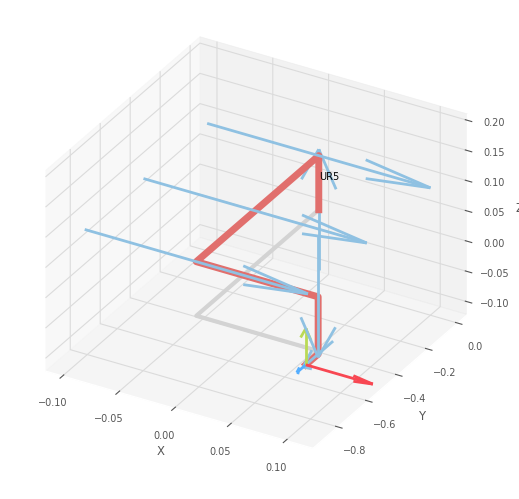

<Figure size 640x480 with 0 Axes>

In [13]:
q_start = [pi/2, 0, 0, 0, pi/2, 0] # ROBOT START CONFIGURATION
robot.plot(q_start)
plt.show()

ROBOT'S END CONFIGURATION

### 3. Let's solve the direct kinematics problem - Решим прямую задачу кинематики

In [14]:
T_start = robot.fkine(q_start) # DISPLAYS START CONFIGURATION JACOBIAN
print(T_start)

   1         0         0         0.1091    
   0         0        -1        -0.8996    
   0         1         0        -0.005191  
   0         0         0         1         



### 6. Let's build the working area of ​​the manipulator - Построим рабочую зону манипулятора

Initialize variables - Инициализируем переменные

In [15]:
n = 20  # Количество точек по каждой оси (THE NUMBER OF POINTS IN EACH AXIS)
i = 0  # Просто счетчик (COUNTER FOR THE POINTS)
move = [np.linspace(robot.links[i].qlim[0], robot.links[i].qlim[1], n) for i in range(3)]  # (DEFINE THE MOVEMENT LIMITS FOR THE 1ST 3 LINKS) - Записываем пределы перемещения для первых трех звеньев
pose = np.zeros([3,n**3])  # (CREATES AN EMPTY ARRAY TO RECORD DATA)

Рассчитываем рабочую зону (CALCULATING THE WORKING AREA)

In [16]:
# Проходимся перебором по каждой точке (GOING THROUGH EACH POINT BY ENUMERATION)
for q1 in move[0]:  # Loop over all values of joint 1
    for q2 in move[1]: # Loop over all values of joint 2
        for q3 in move[2]: # Loop over all values of joint 3
            Tt = robot.fkine([q1,q2,q3,0,0,0])  # (Compute forward kinematics for this joint configuration) - Решаем ПЗК, меняя только первые 3 обобщенных координаты (We solve the PZK by changing only the first 3 generalized coordinates)
            for j in range(3): # Stores x, y, z position
                pose[j][i] = Tt.t[j]  # (Save the point) - Сохраняем точку
            i += 1

Building a work area - Строим рабочую зону

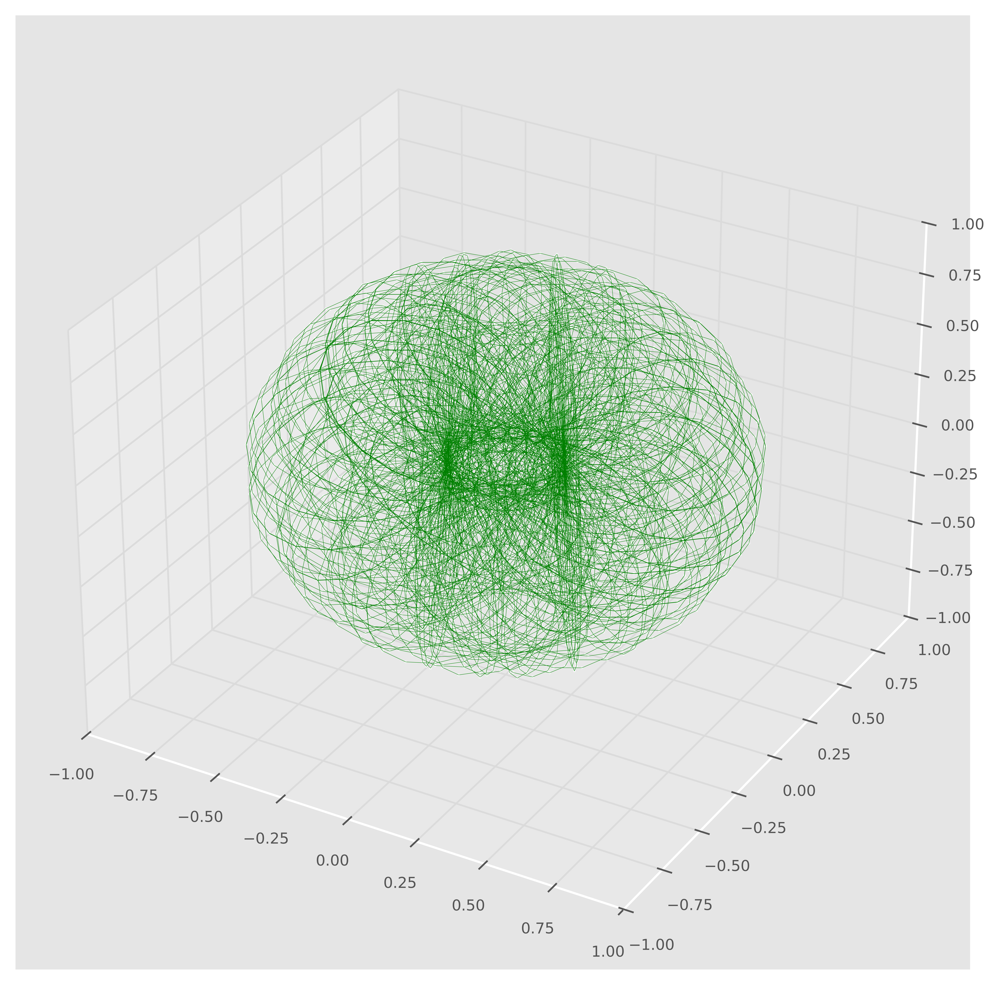

In [18]:
plt.figure(figsize=(8,8), dpi=1000)
ax = plt.axes(projection="3d")
ax.plot3D(pose[0], pose[1], pose[2], color='green', linewidth=0.15)
ax.scatter3D(pose[0], pose[1], pose[2], s=0.5, color='white')
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.set_zlim(-1,1)
plt.show()

### 7. Let's choose the end point and check it (solve the inverse kinematics problem) - 

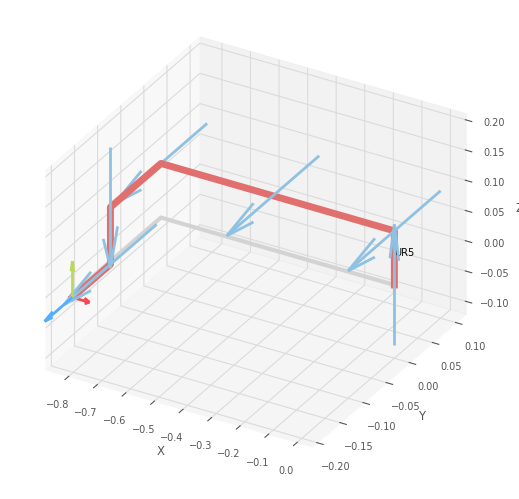

<Figure size 640x480 with 0 Axes>

In [26]:
point = [-0.3,0.2,0.4]
T_end = sb.transl(point)
q_end = [0, 0, 0, 0, 0, 0] # q_end = robot.ikine_GN(T_end).q  # Есть другие методы, помимо ikine_GN
robot.plot(q_end)
plt.show()

### 8. Let's plan the trajectory - Спланируем траекторию

Let's plan a trajectory using the 'jtraj' method for $N$ = 100 points - Спланируем траекторию методом 'jtraj' для $N$ = 100 точек

In [27]:
N = 100
t_start = 0
t_stop = 5
t_shag = t_stop/N
time = np.arange(t_start, t_stop, t_shag)

tr_jtraj = rtb.jtraj(q_start, q_end, time)

Let's plan the same trajectory using the 'mtraj' method with the 'trapezoidal' function - Спланируем ту же траекторию методом 'mtraj' с функцией 'trapezoidal'

In [28]:
tr_trap = rtb.mtraj(rtb.trapezoidal, q_start, q_end, time)

Let's plan the same trajectory using the 'mtraj' method with the 'quintic' function - 

In [29]:
tr_quin = rtb.mtraj(rtb.quintic, q_start, q_end, time)

### 9. Let's plot the graphs 

Let's plot the position graphs for each link 

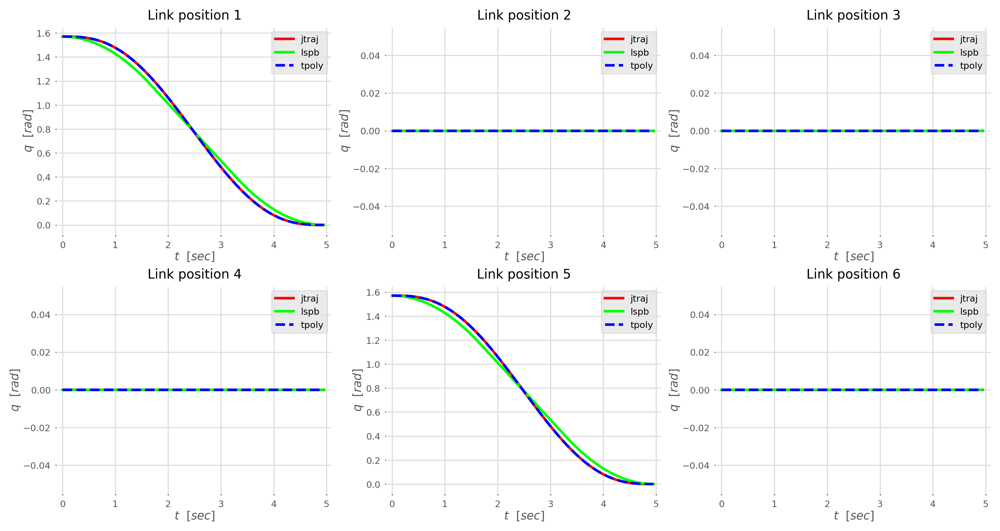

In [30]:
plt.figure(figsize=(10,5), dpi=300)  # We set the canvas dimensions and the dot density (graph clarity) - Задаем размеры холста и плотность точек (четкость графика)
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.2, hspace=0.25)  # We set intervals between graphs so that they do not overlap each other - Задаем интервалы между графиками, чтоб не перекрывали друг друга
    traektoriya_jtraj = [tr_jtraj.q[i][g-1] for i in range(len(tr_jtraj.q))]  # Extracting the required data - Извлекаем нужные данные
    traektoriya_trap = [tr_trap.q[i][g-1] for i in range(len(tr_trap.q))]  # Extracting the required data - Извлекаем нужные данные
    traektoriya_quin = [tr_quin.q[i][g-1] for i in range(len(tr_quin.q))]  # Extracting the required data - Извлекаем нужные данные
    plt.plot(time, traektoriya_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj")  # Drawing a line - Рисуем линию
    plt.plot(time, traektoriya_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb")  # Drawing a line - Рисуем линию
    plt.plot(time, traektoriya_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  # Drawing a lineDrawing a line - Рисуем линию
    plt.title(r"Link position {}".format(g), fontsize=10)  # Graph Title - Название графика
    plt.ylabel(r"$q$  [$rad$]", fontsize=9)  # Y-axis label - Подпись оси Y
    plt.xlabel(r"$t$  [$sec$]", fontsize=9)  # X-axis label - Подпись оси X
    plt.grid(True)  # Adds grids to the graph - Добавить сетку
    plt.legend()  # Show legend (will show what is written in 'label') - Отобразить легенду (покажет то, что написано в 'label')
    ax = plt.gca()  # gca = get current axis - чтобы редактировать конкретную фигуру
    ax.set_facecolor((1,1,1))  # Background color of the chart - Цвет фона на графике
    ax.set_xlim([t_start-0.1,t_stop+0.1])  # X-axis limits - Пределы по оси X
plt.show()

Let's plot the speed graphs for each link - Построим графики скоростей для каждого звена

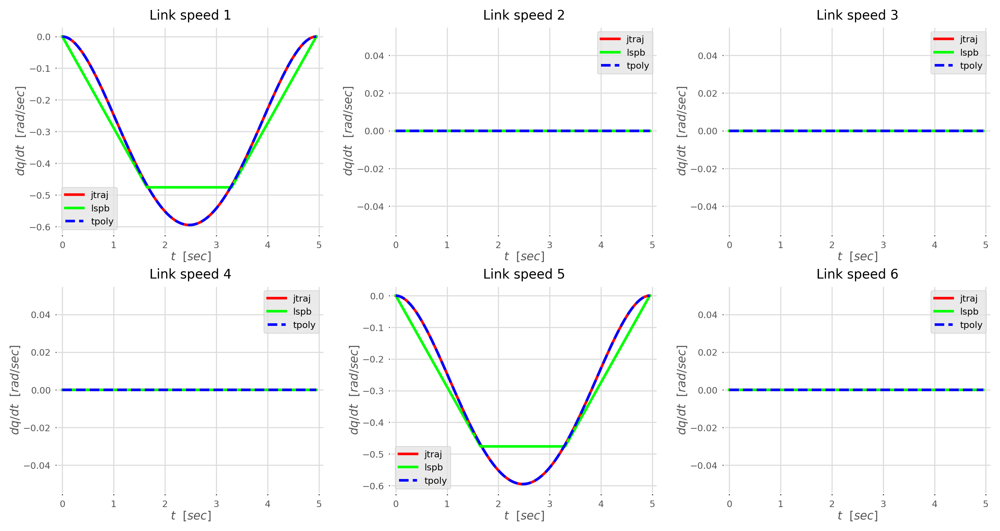

In [31]:
plt.figure(figsize=(10,5), dpi=300)  # We set the canvas dimensions and the dot density (graph clarity) -Задаем размеры холста и плотность точек (четкость графика)
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.25, hspace=0.25)  # We set intervals between graphs so that they do not overlap each other - Задаем интервалы между графиками, чтоб не перекрывали друг друга
    traektoriya_jtraj = [tr_jtraj.qd[i][g-1] for i in range(len(tr_jtraj.qd))]  # Extracting the required data - Извлекаем нужные данные
    traektoriya_trap = [tr_trap.qd[i][g-1] for i in range(len(tr_trap.qd))]  # Extracts the required data - Извлекаем нужные данные
    traektoriya_quin = [tr_quin.qd[i][g-1] for i in range(len(tr_quin.qd))]  # Extracts the required data - Извлекаем нужные данные
    plt.plot(time, traektoriya_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj")  # Draw a line - Рисуем линию
    plt.plot(time, traektoriya_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb")  # Draw a line - Рисуем линию
    plt.plot(time, traektoriya_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  # Draw a line - Рисуем линию
    plt.title(r"Link speed {}".format(g), fontsize=10)  # Graph Title - Название графика
    plt.ylabel(r"$dq/dt$  [$rad/sec$]", fontsize=9)  # Y-axis label - Подпись оси Y
    plt.xlabel(r"$t$  [$sec$]", fontsize=9)  # Подпись оси X
    plt.grid(True)  # Добавить сетку
    plt.legend()  # Отобразить легенду (покажет то, что написано в 'label')
    ax = plt.gca()  # gca = get current axis - чтобы редактировать конкретную фигуру
    ax.set_facecolor((1,1,1))  # Цвет фона на графике
    ax.set_xlim([t_start-0.1,t_stop+0.1])  # Пределы по оси X
plt.show()

Let's plot acceleration graphs for each link - Построим графики ускорений для каждого звена

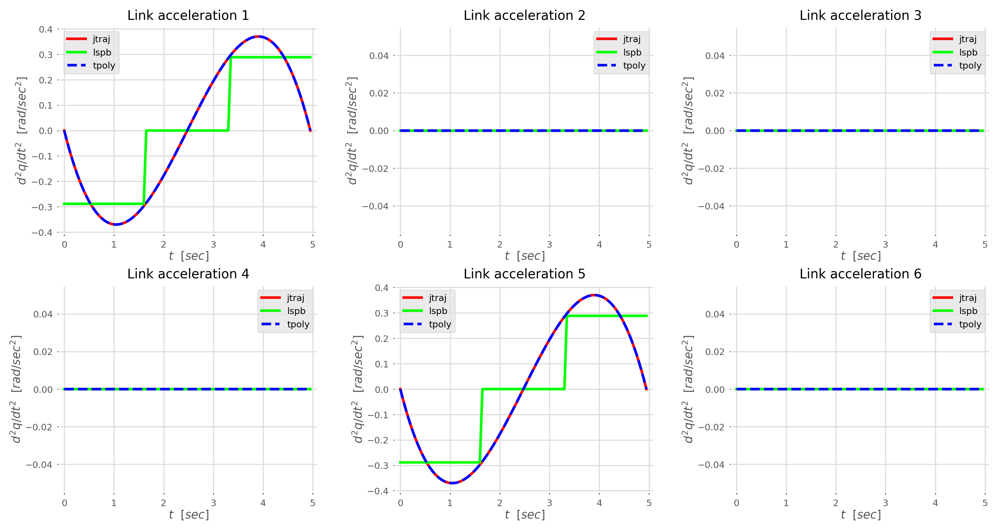

In [25]:
fig = plt.figure(figsize=(10,5), dpi=300)  # We set the canvas dimensions and the dot density (graph clarity) - Задаем размеры холста и плотность точек (четкость графика)
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.3, hspace=0.25)  # We set intervals between graphs so that they do not overlap each other - Задаем интервалы между графиками, чтоб не перекрывали друг друга
    traektoriya_jtraj = [tr_jtraj.qdd[i][g-1] for i in range(len(tr_jtraj.qdd))]  # Extracting the required data - Извлекаем нужные данные
    traektoriya_trap = [tr_trap.qdd[i][g-1] for i in range(len(tr_trap.qdd))]  # Extracting the required data - Извлекаем нужные данные
    traektoriya_quin = [tr_quin.qdd[i][g-1] for i in range(len(tr_quin.qdd))]  # Extracting the required data - Извлекаем нужные данные
    plt.plot(time, traektoriya_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj")  # Draw a line - Рисуем линию
    plt.plot(time, traektoriya_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb")  # Draw a line - Рисуем линию
    plt.plot(time, traektoriya_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  # Draw a line - Рисуем линию
    plt.title(r"Link acceleration {}".format(g), fontsize=10)  # Graph Title - Название графика
    plt.ylabel(r"${d^2}q/d{t^2}$  [$rad/{sec}^2$]", fontsize=9)  # Y-axis label - Подпись оси Y
    plt.xlabel(r"$t$  [$sec$]", fontsize=9)  # Подпись оси X
    plt.grid(True)  # Добавить сетку
    plt.legend()  # Отобразить легенду (покажет то, что написано в 'label')
    ax = plt.gca()  # gca = get current axis - чтобы редактировать конкретную фигуру
    ax.set_facecolor((1,1,1))  # Цвет фона на графике
    ax.set_xlim([t_start-0.1,t_stop+0.1])  # Пределы по оси X
plt.show()

Thanks, Jacob. Let's summarize your work and draw conclusions based on the provided plot and configurations.

---

### **Configuration Summary**

* **Initial configuration** `q_start = [π/2, 0, 0, 0, π/2, 0]` (in radians)
* **Target position**: Cartesian point `[-0.3, 0.2, 0.4]`
* **Target transformation**: `T_end = sb.transl(point)`
* **Inverse Kinematics Method**: You used a manually specified `q_end = [0, 0, 0, 0, 0, 0]` (presumably from `ikine_GN(T_end)`, although other solvers exist like `ikine_LM`, `ikine_min`, etc.)

---

###  **Trajectory Planning Methods Used**

1. **jtraj** – Joint space interpolation (linear interpolation in joint space)
2. **lspb** – Linear segment with parabolic blends (smooth acceleration/deceleration)
3. **tpoly** – Cubic time polynomial (ensures smooth start and stop)

---

###  **Graph Interpretation**

From your plot:

* **Joint 1 and 5** are the only joints with significant movement. This matches the difference between `q_start` and `q_end`.
* **Other joints** remain near-zero — indicating their values were constant in both `q_start` and `q_end`.
* **Trajectory Comparison**:

  * `jtraj` provides a straight interpolation in joint space.
  * `lspb` adds smooth acceleration phases.
  * `tpoly` offers smooth curves with zero velocity/acceleration at endpoints.
* The trajectories are nearly overlapping, indicating **similar effectiveness** for this specific motion.

---

### **Conclusions**

1.  **Forward and inverse kinematics** were successfully computed for UR5 using the DH parameters and toolbox.
2.  **The inverse kinematics solution** yields a feasible joint configuration for the target pose.
3. **The workspace** is reachable at the selected point `[-0.3, 0.2, 0.4]`, validating the manipulator's reachability.
4. **Three trajectory planners** (jtraj, lspb, tpoly) show **similar end-effector path results**, but differ slightly in **velocity and acceleration profiles**, especially near start/end.
5. **tpoly and lspb** are more suitable for real hardware applications due to smooth profiles (reduced jerk), while `jtraj` is simple and efficient.
6. **Only 2 joints** needed to move — this suggests a **redundant solution**. UR5 has 6 DOF, so multiple joint solutions could yield the same end-effector pose.

---

